In [1]:
using DelimitedFiles
using Plots

# apo

## minimization

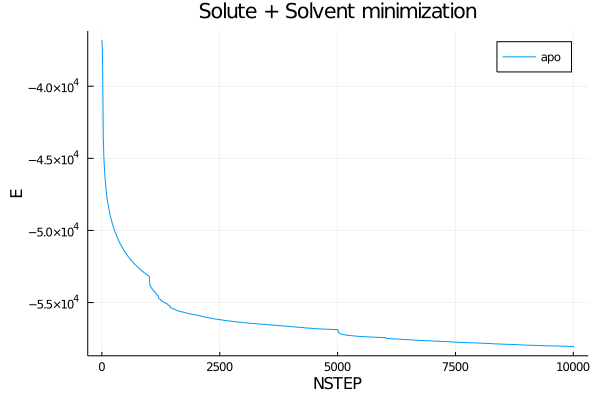

In [2]:
dir_apo_min="/home/pbarletta/labo/20/cph_obp/run/apo/mhe/m"
apo_min_Etot = readdlm("$dir_apo_min/outputs/Etot_min")[:, 2]
apo_mmin_Etot = readdlm("$dir_apo_min/outputs/Etot_mmin")[:, 2]

ntpr = 5
NSTEPS = ntpr * (length(apo_min_Etot) + length(apo_mmin_Etot))
x = collect(0:5:NSTEPS-1)

plot(x, [ apo_min_Etot ; apo_mmin_Etot],
    label = "apo", title = "Solute + Solvent minimization",
    yaxis = "E", xaxis = "NSTEP")

## heat

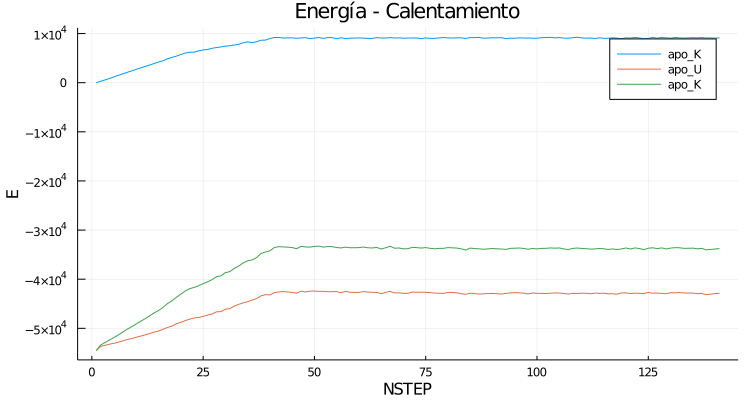

In [3]:
# Energies
dir_apo_hea="/home/pbarletta/labo/20/cph_obp/run/apo/mhe/h"
apo_hea_Ek = readdlm("$dir_apo_hea/outputs/ektot.dat")[:, 2]
apo_hea_Ep = readdlm("$dir_apo_hea/outputs/eptot.dat")[:, 2]
apo_hea_Etot = readdlm("$dir_apo_hea/outputs/etot.dat")[:, 2]

plot(apo_hea_Ek,
    label = "apo_K", title = "Energía - Calentamiento", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_hea_Ep, label = "apo_U")
plot!(apo_hea_Etot, label = "apo_K")

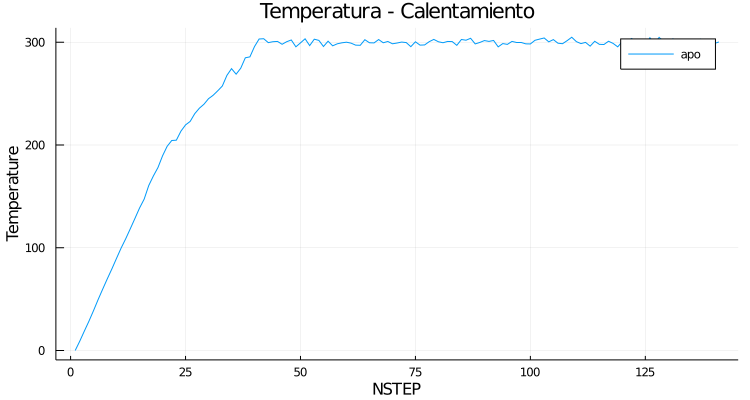

In [4]:
apo_hea_T = readdlm("$dir_apo_hea/outputs/temp.dat")[:, 2]

plot(apo_hea_T,
    label = "apo", title = "Temperatura - Calentamiento", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## equilibration

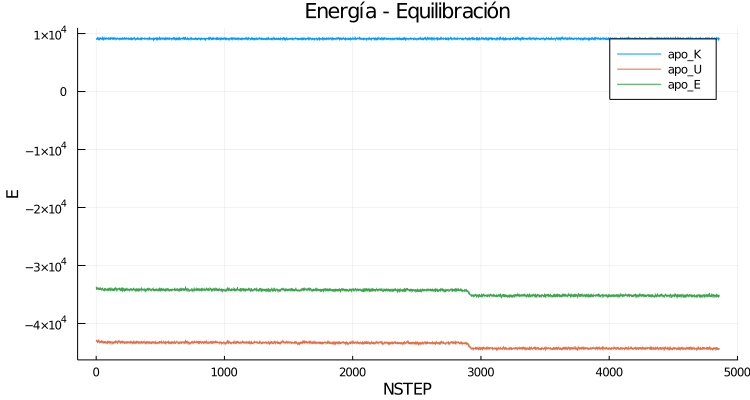

In [5]:
# Energies
dir_apo_equ="/home/pbarletta/labo/20/cph_obp/run/apo/mhe/e"
apo_equ_Ek = readdlm("$dir_apo_equ/outputs/ektot.dat")[:, 2]
apo_equ_Ep = readdlm("$dir_apo_equ/outputs/eptot.dat")[:, 2]
apo_equ_Etot = readdlm("$dir_apo_equ/outputs/etot.dat")[:, 2]

plot(apo_equ_Ek,
    label = "apo_K", title = "Energía - Equilibración", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_equ_Ep, label = "apo_U")
plot!(apo_equ_Etot, label = "apo_E")

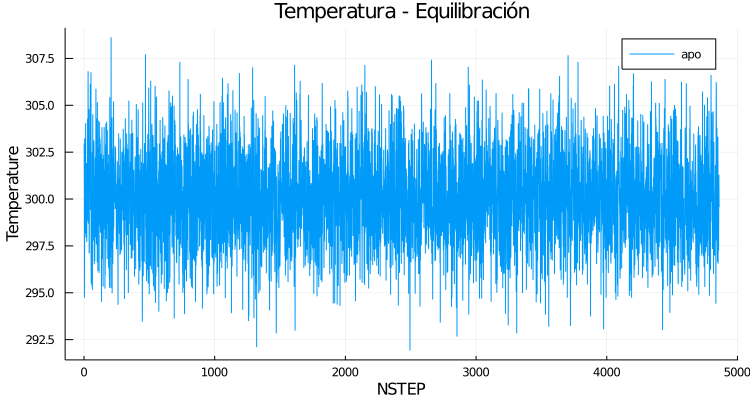

In [6]:
# Temperature
apo_equ_T = readdlm("$dir_apo_equ/outputs/temp.dat")[:, 2]

plot(apo_equ_T,
    label = "apo", title = "Temperatura - Equilibración", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

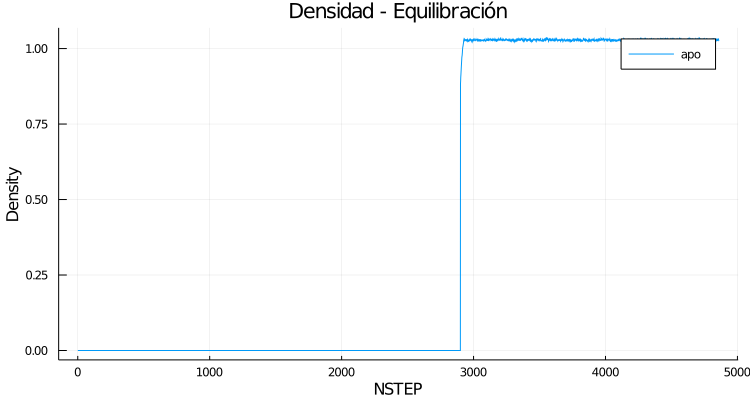

In [7]:
# Density
lb3_equ_dens = readdlm("$dir_apo_equ/outputs/density.dat")[:, 2]
# Only last part was ran at Pr=cte.
lb3_equ_dens[lb3_equ_dens .== ""] .= 0.0
lb3_equ_dens = convert(Array{Float64, 1}, lb3_equ_dens)

plot(lb3_equ_dens,
    label = "apo", title = "Densidad - Equilibración", size = (750, 400),
    yaxis = "Density", xaxis = "NSTEP")

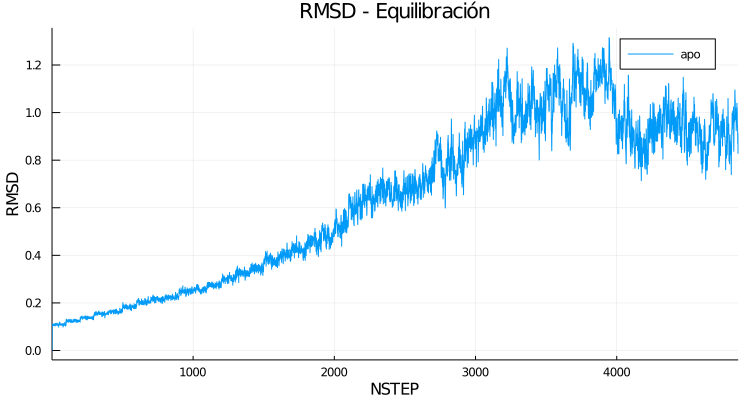

In [8]:
# RMSD ntwx=500
apo_equ_rmsd = readdlm("$dir_apo_equ/rmsd_equ_apo")[2:end, 2]

plot(apo_equ_rmsd,
    xlims = (1, length(apo_equ_rmsd)), xticks = 0:1E3:length(apo_equ_rmsd), yticks = 0:.2:1.5,
    label = "apo", title = "RMSD - Equilibración", size = (750, 400),
    yaxis = "RMSD", xaxis = "NSTEP")

## production

In [10]:
# Energias y temp.s. Los archivos tienen nombre de pH, pero en realidad es por índice de réplica. No fueron reordenados
phs = [ 2.0 ; 2.5 ; 3.0 ; 3.5 ; 4.0 ; 4.5 ; 5.0 ; 5.5 ; 6.0 ; 6.5 ; 7.0 ; 7.5 ]
dir_apo_pdt = "/home/pbarletta/labo/20/cph_obp/run/apo/pdt"
for i in 1:12
    global apo_pdt_KE = readdlm(joinpath(dir_apo_pdt, "outputs", string(phs[i], "ektot.dat")))[2:end, 2]
    global apo_pdt_PE = readdlm(joinpath(dir_apo_pdt, "outputs", string(phs[i], "eptot.dat")))[2:end, 2]
    global apo_pdt_TE = readdlm(joinpath(dir_apo_pdt, "outputs", string(phs[i], "etot.dat")))[2:end, 2]
    global apo_pdt_T = readdlm(joinpath(dir_apo_pdt, "outputs", string(phs[i], "temp.dat")))[2:end, 2]
    
    
    sym_apo_pdt_KE_idx = Symbol("apo_pdt_KE_", i)
    sym_apo_pdt_PE_idx = Symbol("apo_pdt_PE_", i)
    sym_apo_pdt_TE_idx = Symbol("apo_pdt_TE_", i)
    sym_apo_pdt_T_idx = Symbol("apo_pdt_T_", i)
    
    eval(:($sym_apo_pdt_KE_idx = apo_pdt_KE))
    eval(:($sym_apo_pdt_PE_idx = apo_pdt_PE))
    eval(:($sym_apo_pdt_TE_idx = apo_pdt_TE))
    eval(:($sym_apo_pdt_T_idx = apo_pdt_T))
end

## 1

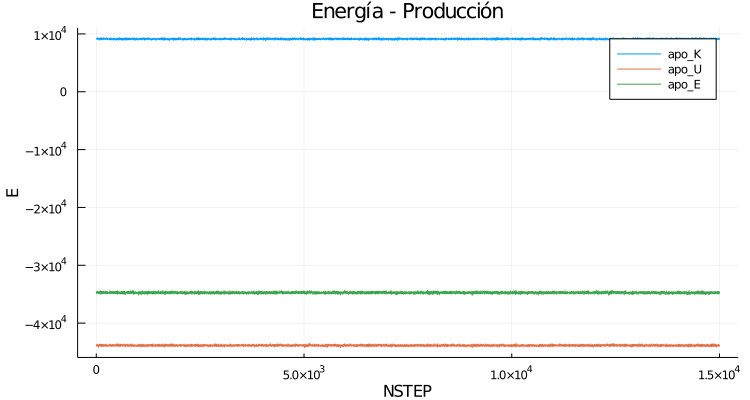

In [11]:
plot(apo_pdt_KE_1,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_1, label = "apo_U")
plot!(apo_pdt_TE_1, label = "apo_E")

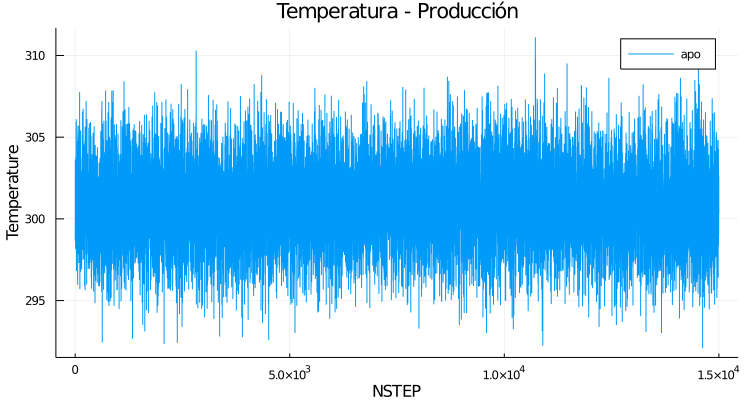

In [12]:
plot(apo_pdt_T_1,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 2

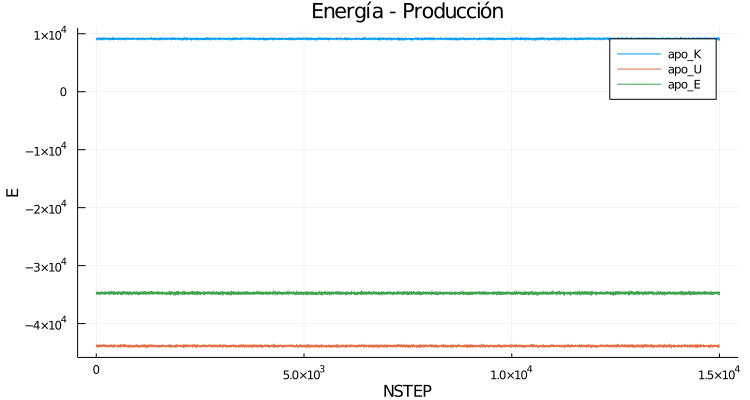

In [17]:
plot(apo_pdt_KE_2,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_2, label = "apo_U")
plot!(apo_pdt_TE_2, label = "apo_E")

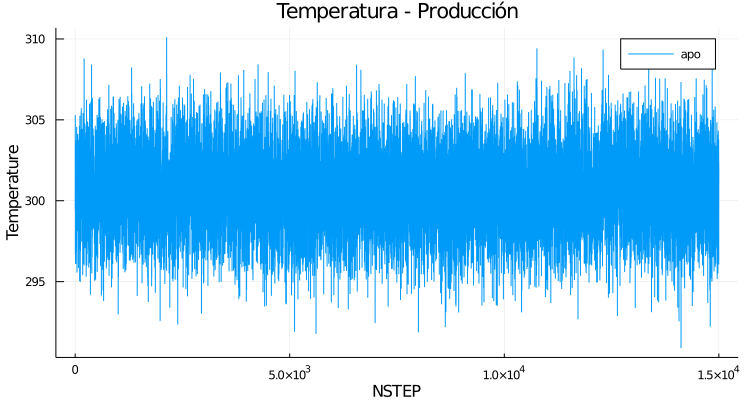

In [18]:
plot(apo_pdt_T_2,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 3

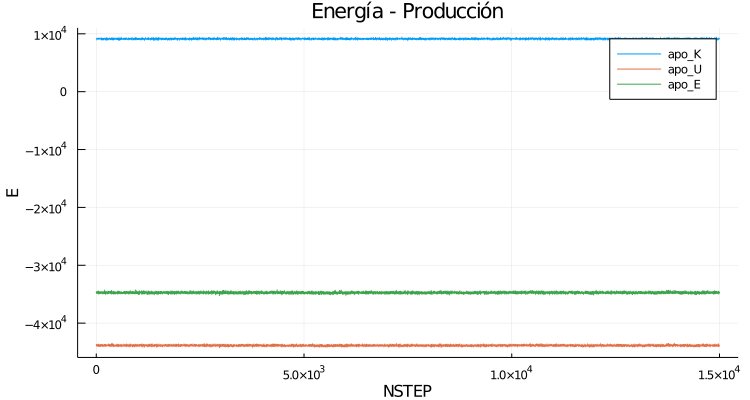

In [19]:
plot(apo_pdt_KE_3,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_3, label = "apo_U")
plot!(apo_pdt_TE_3, label = "apo_E")

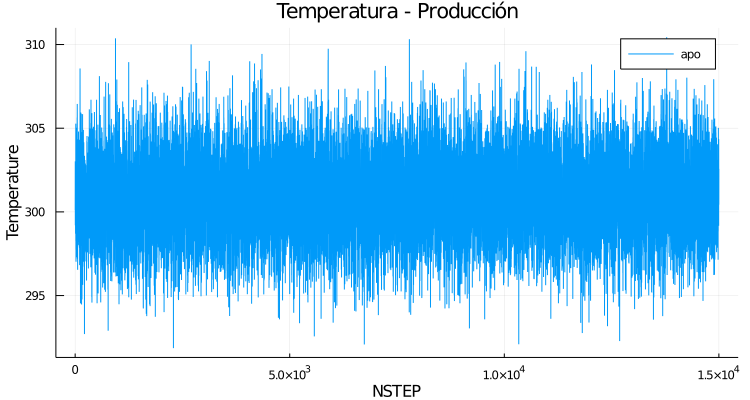

In [20]:
plot(apo_pdt_T_3,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 4

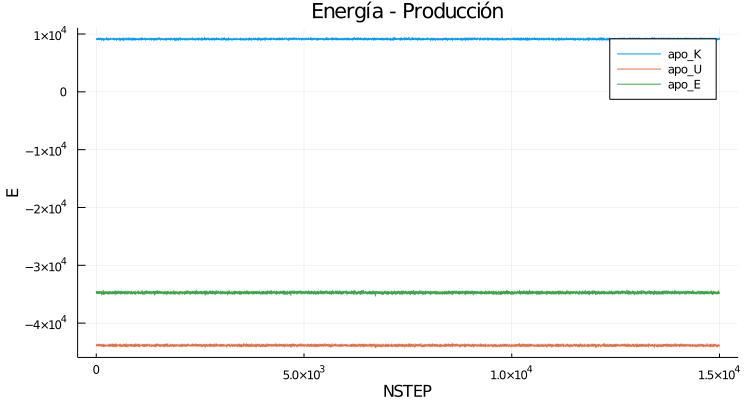

In [21]:
plot(apo_pdt_KE_4,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_4, label = "apo_U")
plot!(apo_pdt_TE_4, label = "apo_E")

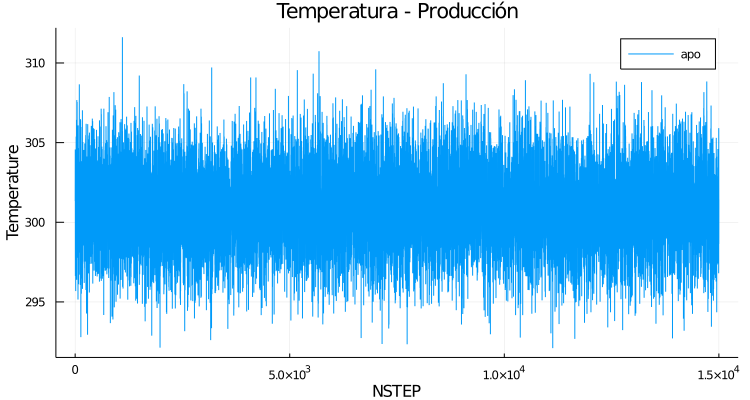

In [22]:
plot(apo_pdt_T_4,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 5

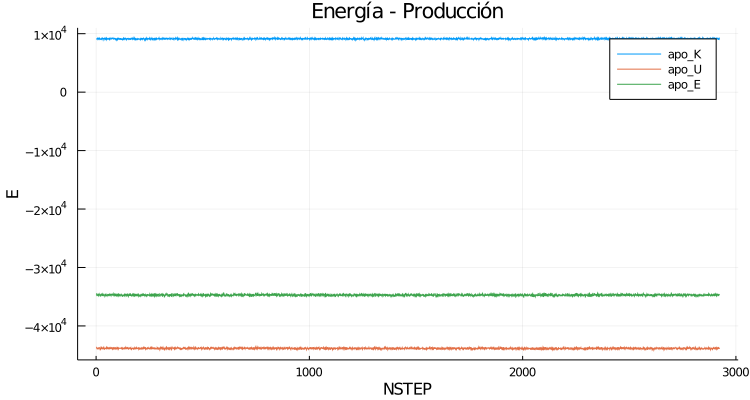

In [23]:
plot(apo_pdt_KE_5,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_5, label = "apo_U")
plot!(apo_pdt_TE_5, label = "apo_E")

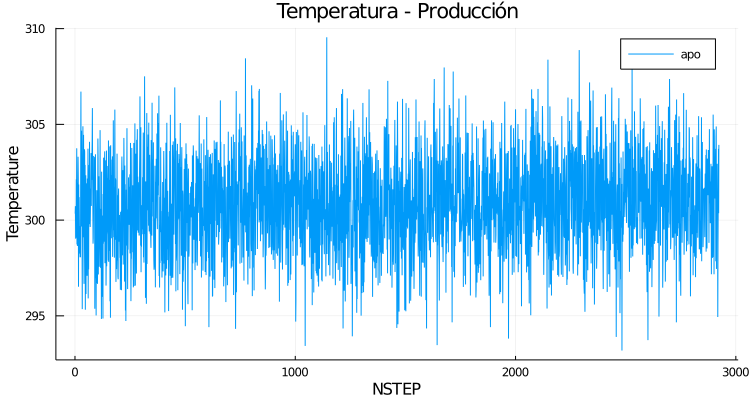

In [24]:
plot(apo_pdt_T_5,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 6

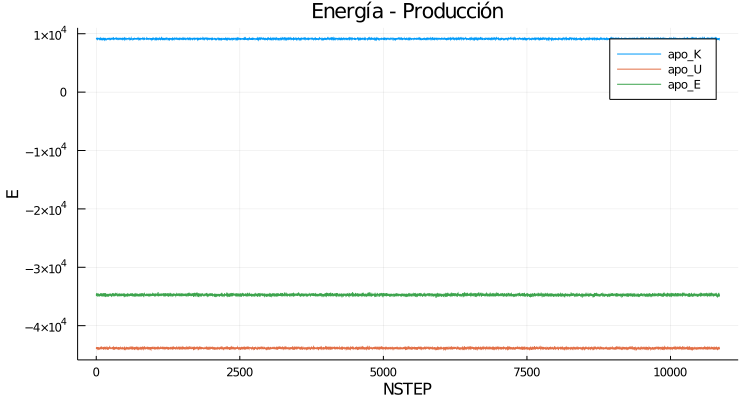

In [25]:
plot(apo_pdt_KE_6,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_6, label = "apo_U")
plot!(apo_pdt_TE_6, label = "apo_E")

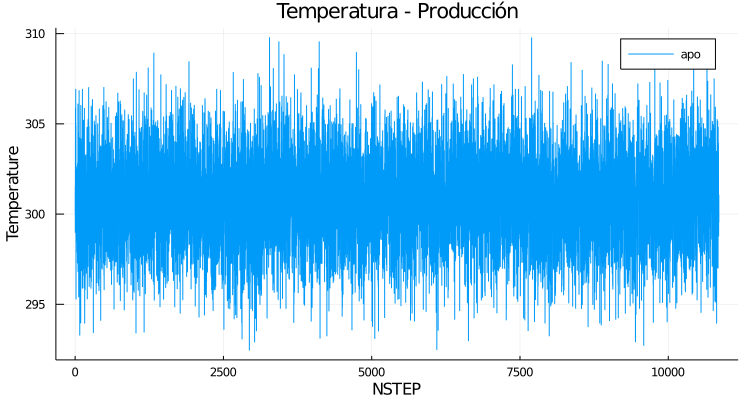

In [26]:
plot(apo_pdt_T_6,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 7

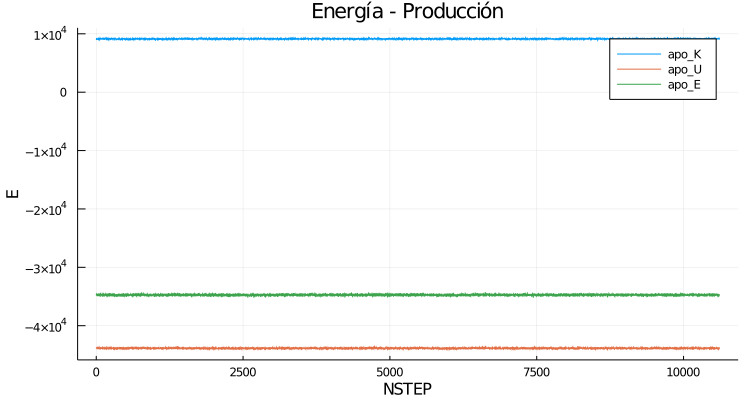

In [27]:
plot(apo_pdt_KE_7,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_7, label = "apo_U")
plot!(apo_pdt_TE_7, label = "apo_E")

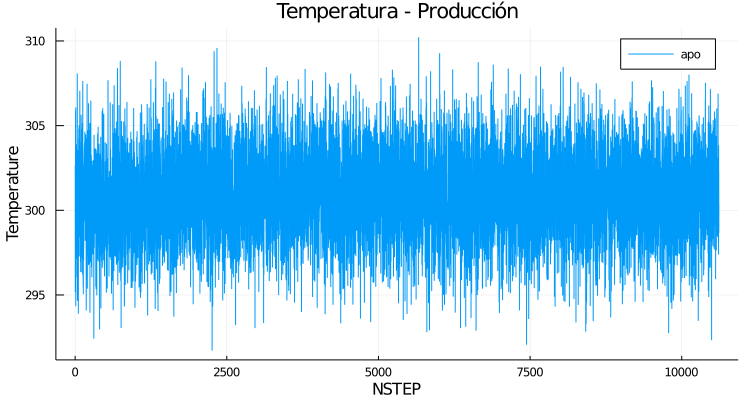

In [28]:
plot(apo_pdt_T_7,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 8

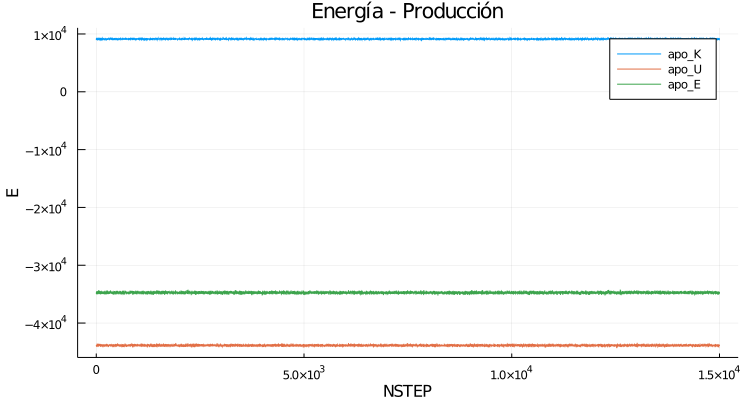

In [29]:
plot(apo_pdt_KE_8,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_8, label = "apo_U")
plot!(apo_pdt_TE_8, label = "apo_E")

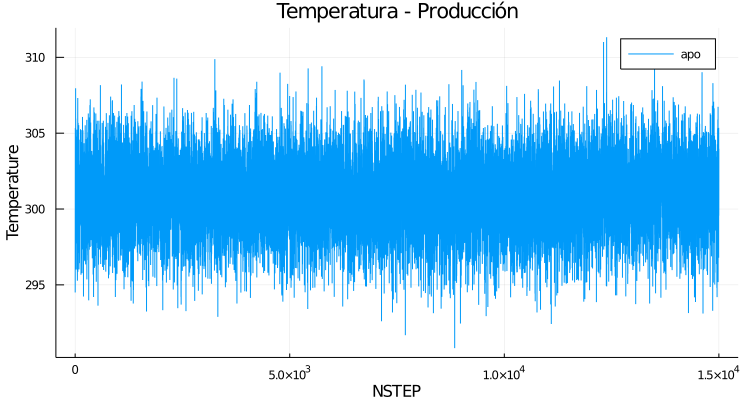

In [30]:
plot(apo_pdt_T_8,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 9

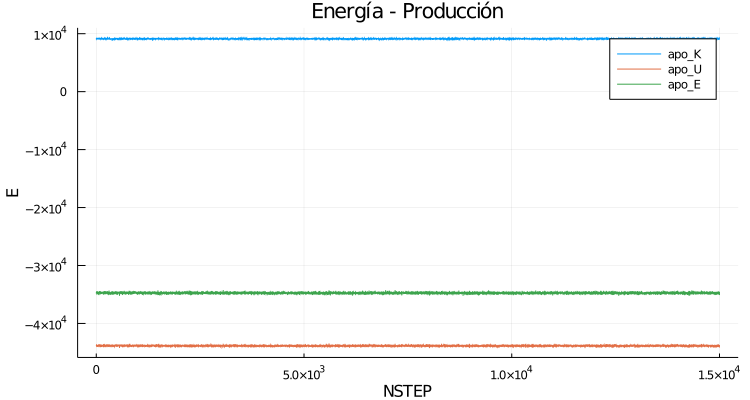

In [31]:
plot(apo_pdt_KE_9,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_9, label = "apo_U")
plot!(apo_pdt_TE_9, label = "apo_E")

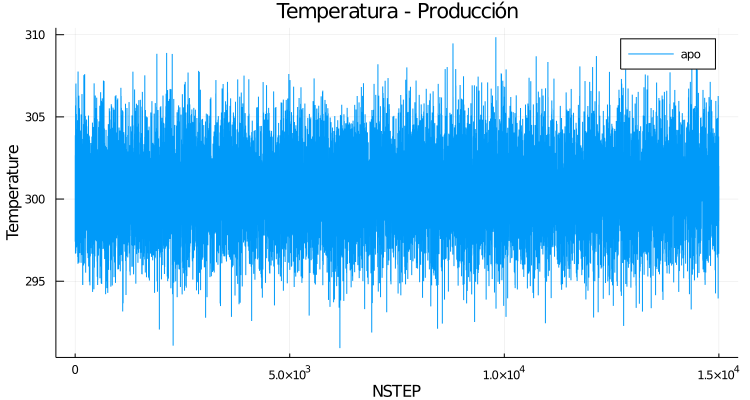

In [32]:
plot(apo_pdt_T_9,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 10

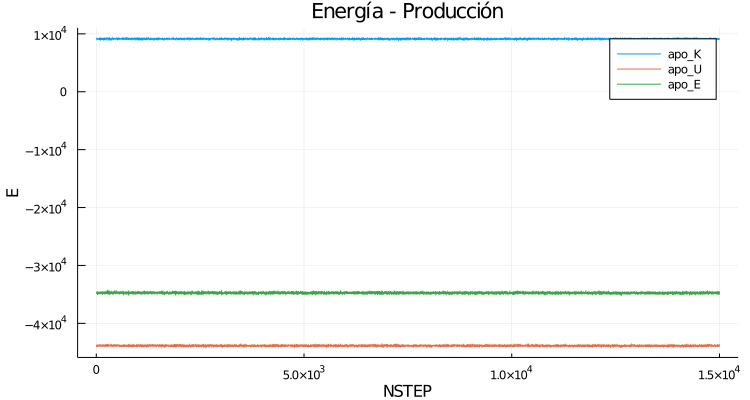

In [33]:
plot(apo_pdt_KE_10,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_10, label = "apo_U")
plot!(apo_pdt_TE_10, label = "apo_E")

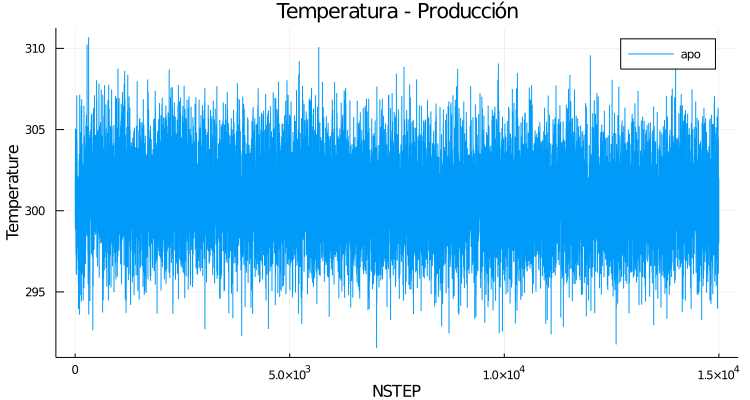

In [34]:
plot(apo_pdt_T_10,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 11

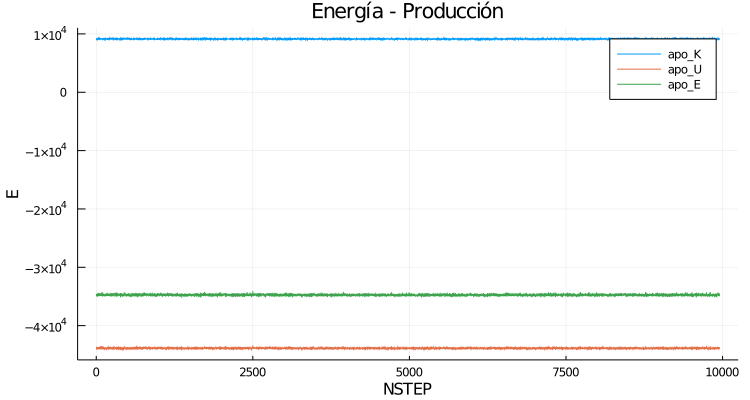

In [13]:
plot(apo_pdt_KE_11,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_11, label = "apo_U")
plot!(apo_pdt_TE_11, label = "apo_E")

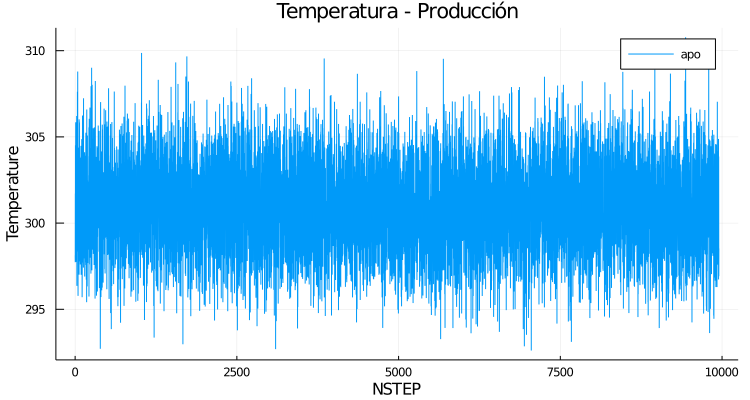

In [14]:
plot(apo_pdt_T_11,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")

## 12

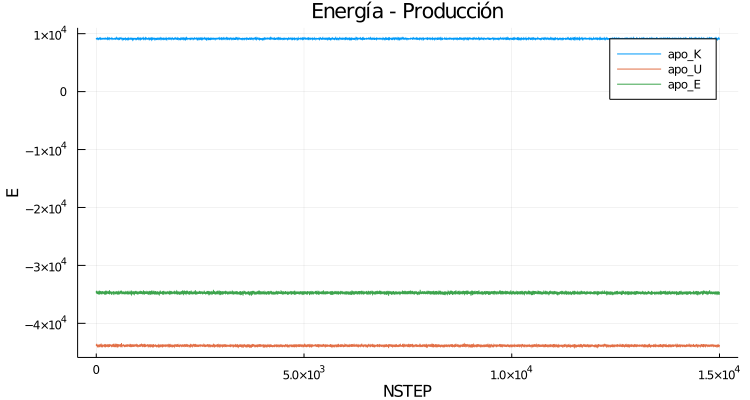

In [15]:
plot(apo_pdt_KE_12,
    label = "apo_K", title = "Energía - Producción", size = (750, 400),
    yaxis = "E", xaxis = "NSTEP")
plot!(apo_pdt_PE_12, label = "apo_U")
plot!(apo_pdt_TE_12, label = "apo_E")


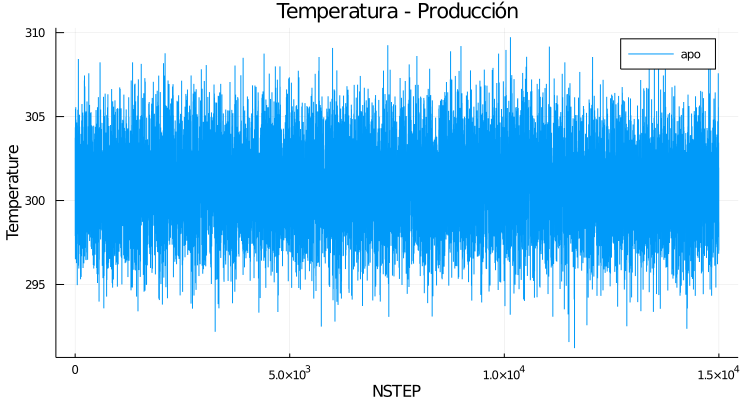

In [16]:
plot(apo_pdt_T_12,
    label = "apo", title = "Temperatura - Producción", size = (750, 400),
    yaxis = "Temperature", xaxis = "NSTEP")